In [15]:
import json
from tqdm import tqdm
import re
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk import FreqDist
import matplotlib.pyplot as plt
from wordcloud import WordCloud, STOPWORDS
import matplotlib.colors as mcolors



path = "darkreddit_authorship_attribution_test_anon.jsonl"
path2 = "darkreddit_authorship_attribution_train_anon.jsonl"
path3 = "darkreddit_authorship_attribution_val_anon.jsonl"
files = [path,path2,path3]


In [16]:
def open_file(file_path):
    author_dict = dict()
    with open(file_path,encoding = 'utf-8') as fp:
        for idx, line in enumerate(tqdm(fp)):
                line = json.loads(line)
                author = line["author"]
                comment = line["comment"]
                if author not in author_dict.keys():
                    author_dict[author] = []
                author_dict[author].append(comment)
                #print(author_dict)
    fp.close()
    return author_dict




In [17]:
#import nltk
#nltk.download('stopwords')
def frequency_word(author, author_dic):
    sentence = " ".join(author_dic[author])
    word_tokens = word_tokenize(sentence)
    #stop_words = set(stopwords.words('english'))
    #filtered_sentence = [w for w in word_tokens if not w.lower() in stop_words]
    '''
    #with no lower case conversion
    filtered_sentence = []

    for w in word_tokens:
        if w not in stop_words:
            filtered_sentence.append(w)
    '''
    #print(word_tokens)
    #print(filtered_sentence)
    fd = FreqDist(word_tokens)
    wc = WordCloud(background_color='white', #设置颜色
                   max_words=1500,
                   stopwords = STOPWORDS)
    wc.generate(sentence)
    fig = plt.figure()
    fig.set_figwidth(14)
    fig.set_figheight(18)

    plt.imshow(wc)
    plt.title(author, fontsize=20)
    plt.axis('off')
    print("frequency words of " + author + " are :",fd.most_common(100))
    plt.show()


2276it [00:00, 212985.79it/s]


darkreddit_authorship_attribution_test_anon.jsonl
frequency words of user1 are : [('.', 3265), ('the', 1988), (',', 1925), ('I', 1672), ('a', 1481), ('to', 1476), ('you', 1082), ('that', 941), ('and', 920), ('it', 847), ('is', 844), ('of', 802), ("n't", 753), ('in', 566), ('are', 504), ('have', 474), ('do', 469), ('they', 460), ('on', 452), ('be', 452), ('for', 427), ('not', 392), ('if', 390), ('this', 378), ('was', 365), ('but', 364), ("'s", 349), ('with', 331), ('or', 326), ('?', 318), ('your', 318), ('as', 262), ('vendor', 250), ('would', 240), ('think', 222), ('at', 219), ('like', 215), ('its', 212), ('from', 207), ('he', 205), ('there', 197), ('what', 197), ('can', 194), ('get', 194), ('could', 191), ('just', 187), ('up', 186), ('an', 181), ('know', 181), ('But', 175), ('will', 169), ('so', 168), ('about', 165), ('-', 161), ("'d", 158), ('did', 156), ("'m", 155), ('If', 154), ('out', 153), ('we', 152), ('my', 150), ('all', 149), ("'ve", 149), ("''", 149), ('people', 148), ('!', 14

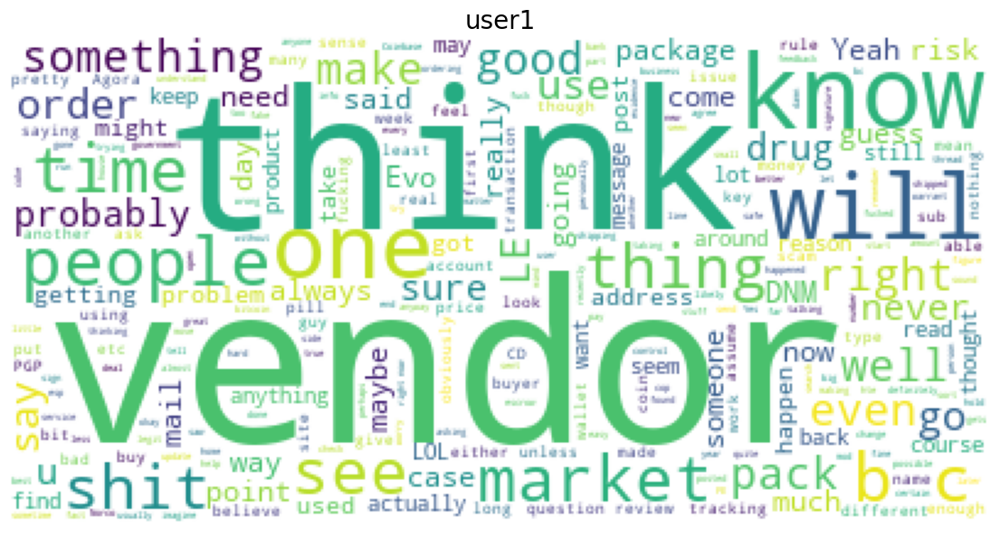

frequency words of user2 are : [('.', 2116), ('to', 1532), ('the', 1268), (',', 1089), ('a', 1056), ('I', 1007), ('and', 968), ('of', 704), ('it', 674), ('you', 641), ('is', 630), ('that', 521), ('for', 483), ('have', 449), ('in', 447), ("n't", 393), ('are', 379), ('as', 320), ("'s", 300), ('do', 296), ('or', 293), ('people', 288), ('this', 288), ('not', 280), ('be', 268), ('on', 259), ('we', 251), ('but', 237), ('*', 232), ('with', 228), ('they', 220), ('your', 209), ('will', 198), (')', 184), ('(', 180), ('about', 179), ('what', 171), ('can', 171), ('thread', 170), ('so', 167), ('am', 167), ('just', 164), ('It', 161), ('there', 154), ('more', 154), ('if', 154), ('rules', 140), ('all', 137), ('was', 136), ('them', 136), ('post', 133), ('who', 131), ('at', 129), ('get', 124), ('We', 120), ('like', 119), ('would', 118), ('me', 116), (':', 115), ('out', 113), ('really', 109), ('time', 108), ('up', 107), ('threads', 104), ('make', 104), ('one', 103), ("'re", 103), ('!', 102), ('``', 101),

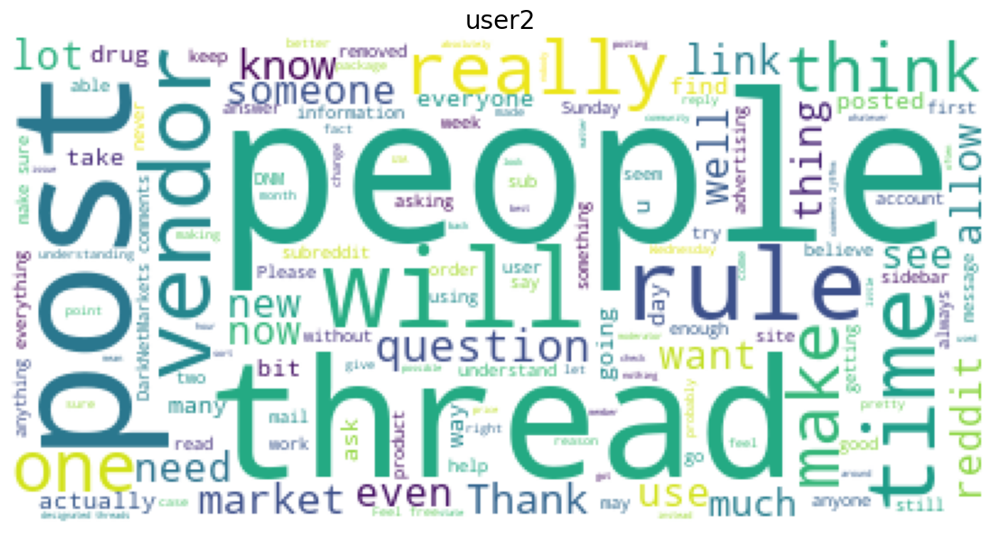

frequency words of user3 are : [('.', 1097), ('the', 752), ('to', 672), (',', 599), ('a', 521), ('and', 478), ('it', 446), ('you', 416), ('of', 345), ('that', 309), ('in', 276), ("'s", 247), ('is', 216), ("n't", 204), ('for', 204), ('they', 201), ('on', 191), ('be', 189), ('I', 152), ('if', 142), ('have', 142), ('i', 141), ('your', 133), ('do', 131), ('just', 128), ('as', 122), ('with', 110), ('*', 106), ('can', 105), ("'re", 100), ('from', 99), ('get', 99), ('are', 97), ('or', 96), ('would', 93), (';', 92), ('not', 91), ('&', 88), ('gt', 87), ('was', 87), ('?', 85), ('one', 81), ('out', 80), ('at', 80), ('about', 78), ('them', 78), ('up', 78), ('all', 71), ('there', 70), (')', 69), ('but', 68), ('(', 67), ('he', 65), ('so', 65), ('like', 65), ('what', 64), ('some', 63), ('their', 61), ('go', 60), ('my', 59), ("'ll", 55), ('will', 50), ('...', 49), ('an', 49), ('because', 49), ('anything', 49), ('by', 48), ('this', 47), ('time', 47), ('no', 45), ('does', 45), ('than', 45), ('people', 4

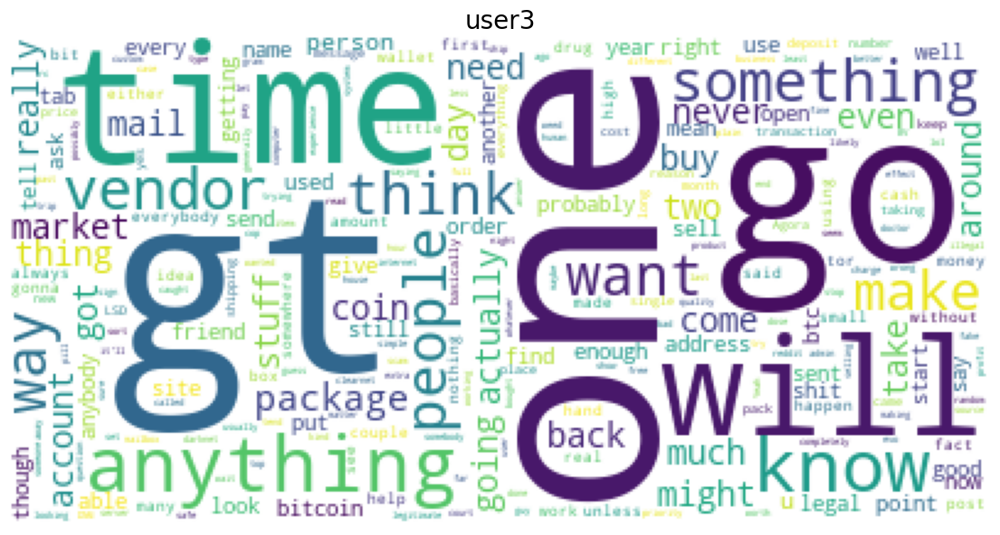

frequency words of user4 are : [('.', 2153), (',', 1645), ('the', 1257), ('a', 1006), ('to', 947), ('and', 677), ('I', 598), ('of', 579), ('you', 537), ('it', 506), ('in', 430), ('is', 417), ("n't", 394), ('on', 335), ('that', 317), ('for', 302), ("''", 290), ('``', 273), ('have', 260), ('are', 245), ('with', 235), ("'s", 234), ('they', 229), ('do', 217), ('your', 206), ('be', 192), ('or', 189), ('?', 183), ('like', 183), ('was', 180), ('he', 178), ('bitcoin', 173), ('vendor', 172), ('from', 168), ('its', 158), ('just', 150), ('but', 146), ('if', 140), ('an', 135), ('The', 132), ('can', 130), ('get', 128), ('You', 125), ('has', 125), ('not', 122), ('because', 120), ('vendors', 118), ('their', 118), ('as', 117), ('Its', 116), ('If', 112), ('one', 112), ('would', 112), ('we', 110), ('all', 109), ('who', 108), ("'re", 106), ('will', 106), ('(', 105), (')', 102), ('at', 101), ('about', 100), ('them', 100), ('my', 98), ('by', 97), ('so', 92), ('his', 91), ('this', 91), ('which', 88), ('when

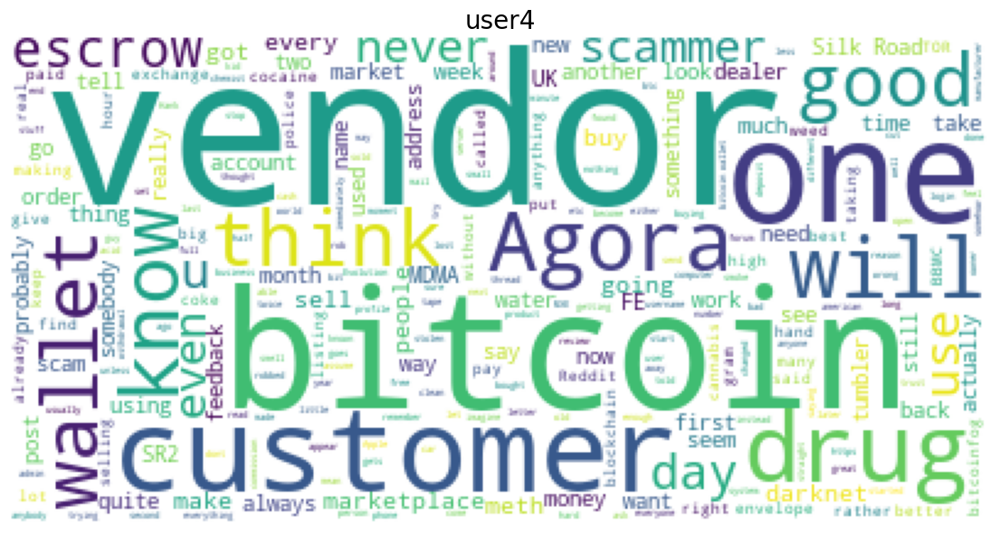

frequency words of user5 are : [('.', 878), (',', 751), ('the', 503), ('to', 441), ('I', 377), ('and', 342), ('you', 333), ('of', 330), ('a', 328), ('is', 300), ('that', 267), ('it', 239), ("'s", 156), ('in', 155), ('for', 155), ('not', 153), ('``', 149), ("''", 149), ('are', 147), ("n't", 145), ('?', 142), ('be', 132), ('with', 127), ('your', 125), ('have', 124), ('on', 119), ('do', 108), ('they', 108), ('this', 97), ('was', 92), ('can', 90), ('*', 90), ('just', 84), ('or', 83), ('like', 82), ('people', 80), ('as', 79), ('if', 78), ('about', 78), ('my', 77), ('at', 75), ('would', 72), ('...', 70), ('all', 69), ('from', 69), ('It', 63), ('an', 63), ('know', 62), ('what', 61), ('but', 59), ('(', 56), ('so', 56), (')', 56), ('me', 56), ('when', 53), ('one', 53), ('out', 52), ('get', 49), (';', 48), ('up', 46), ('has', 46), ('If', 45), ('than', 45), ('how', 44), ('does', 44), ('&', 43), ('gt', 43), ('vendor', 43), ('!', 43), ('no', 42), ('even', 42), ('much', 41), ('The', 41), ('then', 40

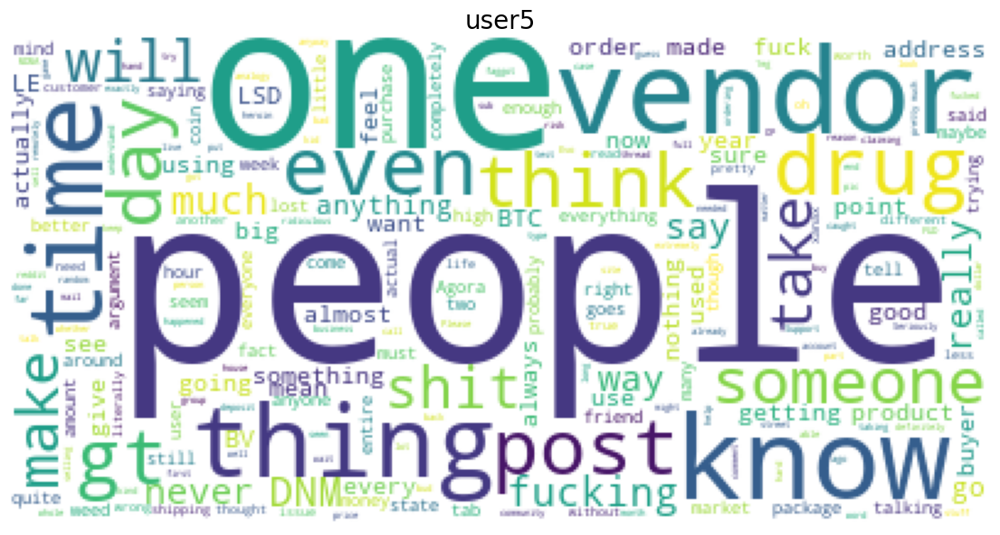

frequency words of user6 are : [('.', 921), (',', 782), ('I', 570), ('the', 569), ('to', 475), ('and', 456), ('a', 384), ('*', 346), ('of', 310), ('you', 284), ('that', 279), ('it', 244), ("'s", 199), ('is', 198), ("n't", 182), ('in', 176), ('but', 137), ('for', 128), ('was', 125), ('be', 124), ('on', 123), ('have', 123), ('your', 117), ('not', 110), ('do', 108), ('my', 106), ('with', 106), ('as', 97), ('or', 91), ('this', 89), ('are', 88), ('?', 87), ('if', 82), ('just', 82), ('me', 78), ('they', 71), ('can', 71), ('he', 71), ("'m", 69), ('all', 69), ('at', 67), ('``', 66), ("''", 66), ('up', 64), ('there', 64), ('about', 63), (';', 63), ('has', 62), ('we', 61), ('like', 60), ('some', 58), ('so', 57), ('from', 57), ("'re", 56), ('would', 55), ("'ve", 55), ('time', 53), ('what', 53), ('an', 53), (':', 53), (')', 49), ('think', 49), ('one', 48), ('no', 48), ('by', 47), ('his', 46), ('out', 46), ("'d", 45), ('vendor', 44), ('had', 44), ('their', 43), ('(', 42), ('will', 42), ('when', 41)

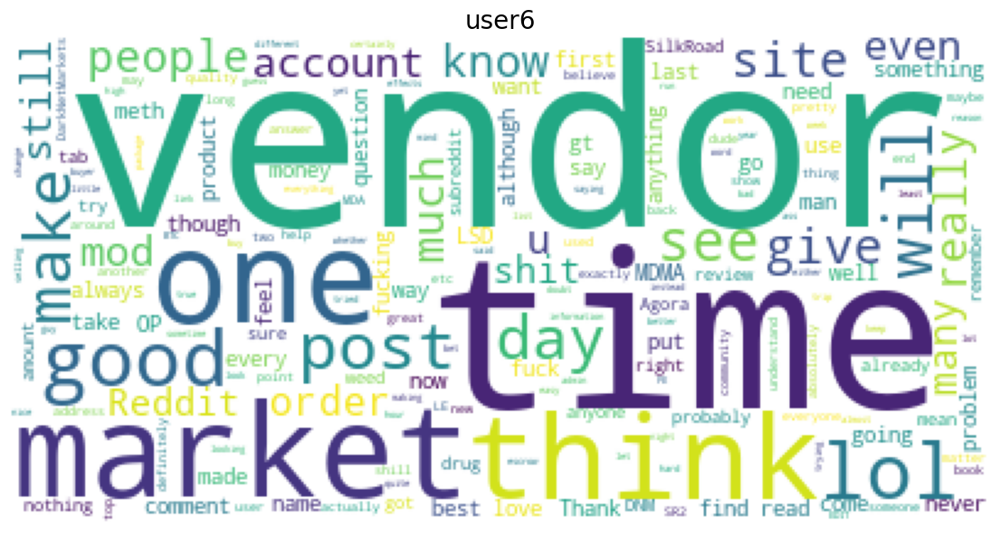

frequency words of user7 are : [('.', 917), ('the', 586), ('to', 497), ('a', 495), (',', 451), ('and', 392), ('of', 332), ('you', 314), ('is', 265), ('that', 207), ("'s", 207), ('it', 196), ('in', 194), ('on', 178), ('Grand', 177), ('Wizard', 177), ('be', 157), ('for', 154), ('with', 150), ('The', 143), ('are', 138), ('your', 128), (':', 125), ("n't", 120), ('``', 117), ("''", 115), ('he', 113), ('not', 106), ('have', 105), ('(', 99), (')', 99), ('or', 98), ('they', 93), ('*', 92), ('was', 91), ('an', 83), ('at', 82), ('as', 82), ('this', 79), ('has', 78), ('up', 77), ('who', 77), ("'re", 77), ('?', 76), ('I', 75), ('do', 73), ('but', 72), ('will', 70), ('If', 70), (';', 69), ('from', 69), ('get', 68), ('out', 68), ('would', 67), ('we', 67), ('if', 67), ('about', 66), ('--', 64), ('there', 57), ('people', 55), ('can', 53), ('more', 52), ('than', 52), ('some', 50), ('all', 50), ('like', 50), ('&', 49), ('their', 49), ('one', 47), ('But', 46), ('his', 46), ('going', 45), ('had', 45), ('c

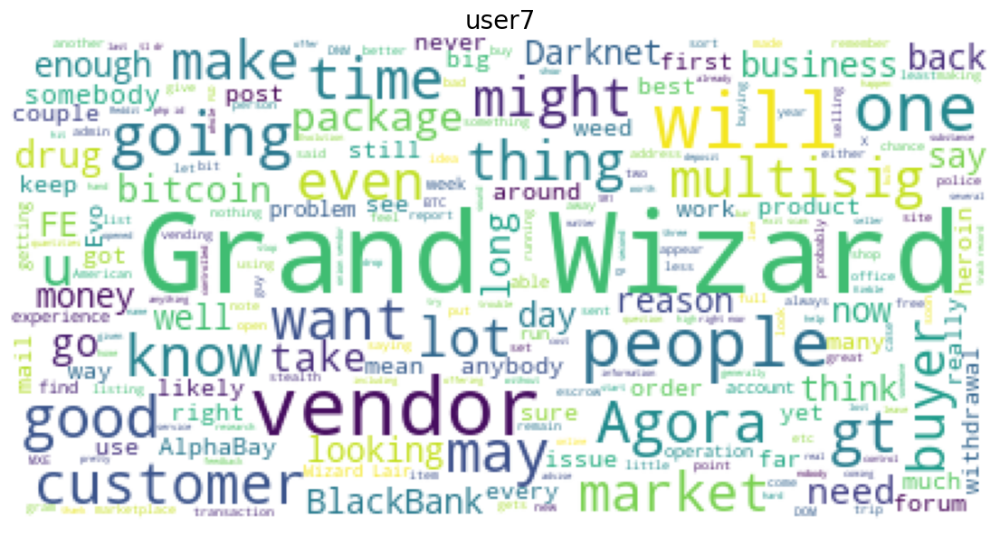

frequency words of user8 are : [('.', 839), ('I', 588), ('the', 444), ('a', 380), ('to', 369), (',', 336), ('and', 329), ('it', 306), ('you', 300), ('of', 257), ('that', 211), ('is', 181), ("n't", 168), ('but', 156), ('in', 155), ('have', 141), ('for', 127), ('was', 122), ('would', 114), ('are', 112), ('do', 107), ('on', 106), ('be', 96), ('like', 95), ('your', 94), ('or', 92), ('if', 86), ('they', 85), ('with', 82), ('just', 78), ('get', 77), ('so', 74), ('can', 72), ('not', 70), ('as', 65), ('this', 64), ('them', 63), ('some', 62), ('?', 60), ('my', 59), ('he', 58), ('me', 56), ('up', 56), ('will', 56), ('people', 55), ("'s", 55), ('had', 54), ('(', 53), (')', 52), ('all', 51), ('at', 48), ('got', 47), ('about', 47), ('we', 46), ('other', 46), ('out', 45), ('think', 44), ('good', 42), ('know', 42), ('because', 41), ('post', 41), ('from', 40), ("'m", 40), ('there', 40), ('If', 40), ('vendor', 40), ('did', 38), ('``', 38), ("''", 38), ('has', 37), ('what', 37), ('You', 37), ('time', 37

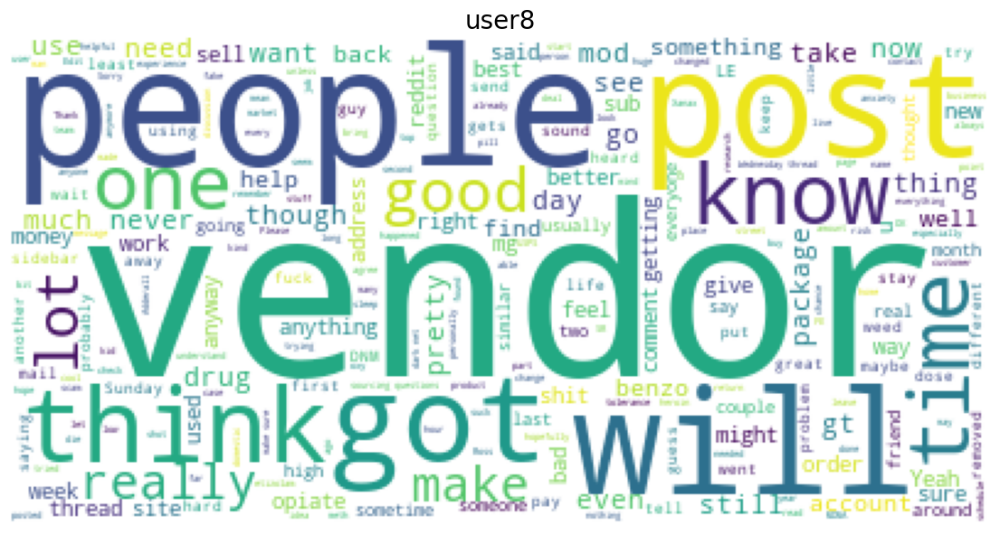

frequency words of user9 are : [('.', 710), ('the', 477), ('to', 349), ('I', 275), ('a', 256), (',', 243), ('and', 204), ('is', 203), ('you', 145), ('of', 138), ('that', 131), ('it', 128), (';', 118), ('*', 110), ("n't", 108), ('they', 105), ('are', 101), ('&', 100), ('for', 99), ('gt', 96), ('not', 91), ('in', 88), ('this', 85), ('have', 84), ('be', 80), ('do', 78), (')', 78), ('was', 77), ('(', 77), ('?', 75), (':', 74), ('your', 68), ('would', 67), ('but', 64), ('on', 64), ('like', 59), ('or', 57), ("'s", 54), ('with', 52), ('The', 52), ('so', 47), ('if', 43), ('can', 42), ('he', 40), ('as', 40), ('an', 39), ('will', 39), ('think', 38), ('about', 36), ('one', 36), ('at', 35), ('If', 34), ('This', 33), ('use', 33), ('their', 33), ('some', 32), ('all', 31), ("'m", 31), ('just', 30), ('get', 29), ('were', 29), ('from', 29), ('its', 29), ('more', 28), ('who', 28), ('how', 27), ('has', 27), ('what', 26), ('only', 26), ('know', 26), ('edit', 26), ('which', 25), ('people', 24), ('very', 24

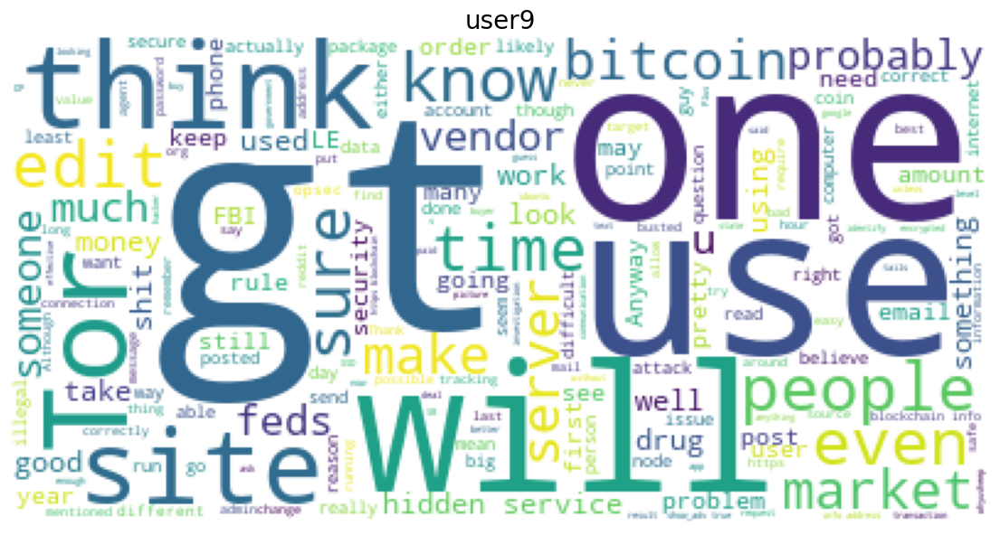

6817it [00:00, 251624.28it/s]

darkreddit_authorship_attribution_train_anon.jsonl


frequency words of user1 are : [('.', 9532), ('the', 5452), (',', 5006), ('I', 4876), ('a', 3960), ('to', 3926), ('you', 2714), ('and', 2692), ('it', 2602), ('that', 2538), ('is', 2394), ('of', 2165), ("n't", 2083), ('in', 1461), ('are', 1441), ('do', 1397), ('be', 1308), ('they', 1253), ('for', 1201), ('have', 1195), ('on', 1160), ('was', 1142), ('if', 1124), ('this', 1070), ('not', 1049), ('but', 1001), ("'s", 904), ('with', 900), ('or', 886), ('?', 838), ('your', 803), ('as', 752), ('would', 699), ('at', 667), ('get', 631), ('think', 626), ('like', 618), ('vendor', 584), ('just', 566), ('there', 565), ('its', 563), ('all', 546), ('what', 529), ('know', 524), ("'d", 514), ('an', 514), ('he', 509), ('up', 506), ('so', 498), ('out', 489), ('can', 483), ('my', 480), ('If', 475), ('about', 471), ('could', 469), ('more', 467), ('from', 467), ("'m", 465), ('-', 462), ('But', 460), ('will', 446), ('!', 427), ('some', 420), ('time', 392), ("'ve", 389), ('did', 387), ('one', 374), ('who', 363

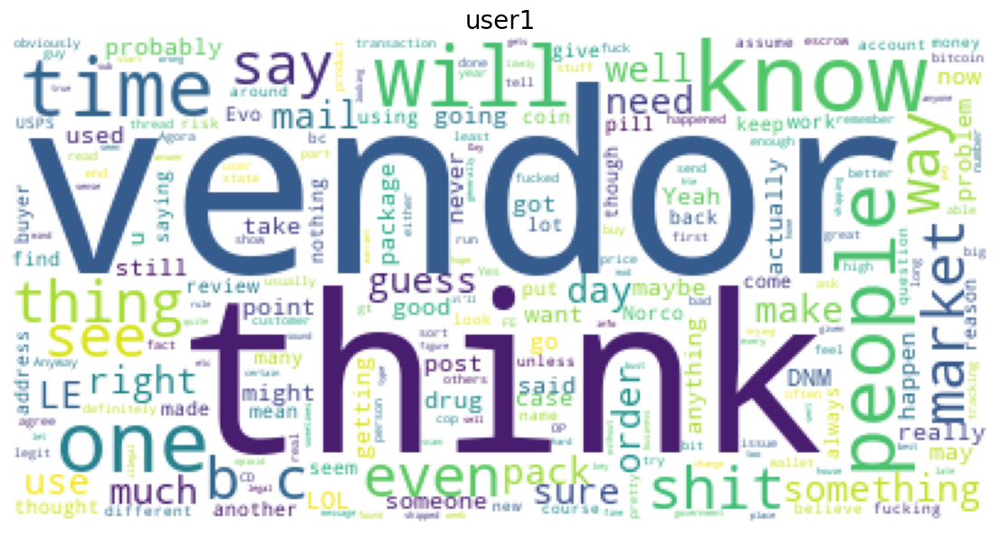

frequency words of user2 are : [('.', 6806), ('to', 4803), ('the', 4114), ('a', 3492), (',', 3487), ('I', 3474), ('and', 3202), ('it', 2272), ('of', 2154), ('you', 2030), ('is', 1961), ('that', 1740), ('for', 1530), ('in', 1519), ('have', 1413), ("n't", 1378), ('are', 1151), ('as', 1070), ('do', 1046), ("'s", 962), ('be', 925), ('this', 910), ('on', 896), ('or', 863), ('not', 838), ('people', 836), ('we', 812), ('*', 743), ('with', 718), ('but', 709), ('your', 704), ('they', 698), ('about', 638), ('will', 616), ('if', 552), ('just', 541), ('can', 526), ('(', 525), (')', 524), ('thread', 511), ('what', 500), ('It', 492), ('was', 492), ('am', 484), ('so', 461), ('more', 460), ('post', 444), ('like', 434), ('at', 430), ('``', 428), ("''", 428), ('rules', 419), ('them', 417), ('one', 408), ('would', 398), ('get', 391), ('all', 390), ('We', 390), (';', 389), ('really', 388), ('my', 375), ('there', 374), ("'re", 373), ('me', 360), ('who', 359), ('out', 357), ('!', 353), ('up', 342), ('an', 3

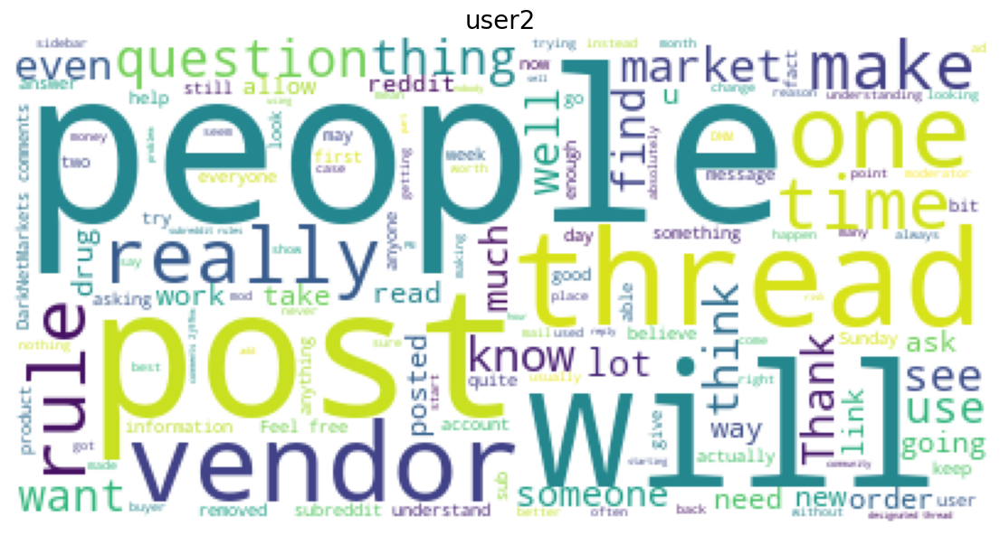

frequency words of user3 are : [('.', 3100), ('the', 2101), ('to', 1726), (',', 1578), ('a', 1495), ('and', 1381), ('it', 1262), ('you', 1187), ('of', 1005), ('that', 908), ('in', 756), ("'s", 702), ('they', 592), ('is', 586), ("n't", 585), ('for', 570), ('be', 519), ('on', 491), ('i', 442), ('your', 417), ('do', 415), ('I', 409), ('if', 400), ('have', 361), ('with', 358), ('just', 357), ('*', 328), (';', 301), ('as', 296), ('&', 293), ("'re", 286), ('or', 274), ('gt', 271), ('are', 269), ('get', 268), ('?', 260), ('not', 259), ('would', 257), ('them', 257), ('from', 254), ('like', 248), ('was', 244), ('can', 235), ('out', 221), ('at', 218), (')', 214), ('up', 212), ('all', 208), ('(', 202), ('he', 200), ('one', 198), ('what', 193), ('there', 188), ('about', 187), ('their', 184), ('but', 173), ('so', 171), ('...', 170), ('this', 170), ('my', 161), ('an', 158), ('time', 156), ('when', 151), ('because', 148), ('only', 145), ('more', 143), ('any', 141), ("'ll", 140), ('could', 132), ('me'

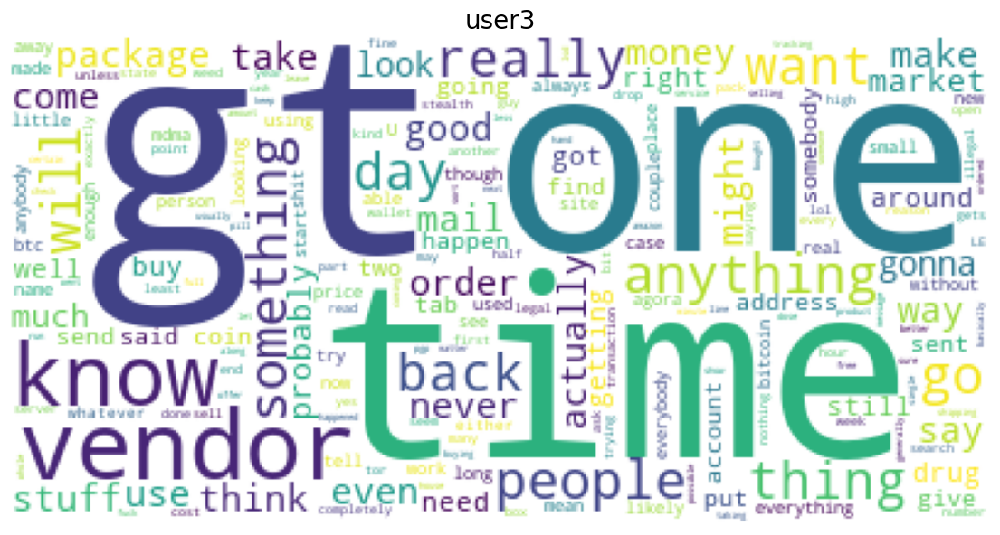

frequency words of user4 are : [('.', 7172), (',', 5850), ('the', 4312), ('to', 3484), ('a', 3428), ('and', 2481), ('of', 2148), ('you', 2100), ('I', 1854), ('it', 1696), ('is', 1452), ("n't", 1439), ('in', 1372), ('on', 1071), ('that', 1042), ('for', 1012), ("''", 1006), ('``', 979), ('are', 867), ('they', 863), ('have', 851), ('with', 773), ("'s", 772), ('do', 752), ('be', 739), ('your', 697), ('or', 681), ('?', 603), ('like', 584), ('was', 575), ('vendor', 567), ('he', 563), ('its', 561), ('--', 550), ('but', 545), ('who', 528), ('from', 524), ('can', 494), ('their', 482), ('just', 479), ('You', 476), ('The', 454), ('bitcoin', 453), ('will', 449), ('an', 437), ('meth', 436), ("'re", 434), ('If', 425), ('vendors', 424), ('not', 423), ('get', 420), ('about', 409), ('all', 400), ('because', 393), ('them', 390), ('as', 389), ('if', 385), ('(', 384), (')', 380), ('by', 369), ('would', 365), ('we', 364), ('at', 361), ('drugs', 360), ('one', 357), ('-', 346), ('has', 341), ('Its', 337), ('

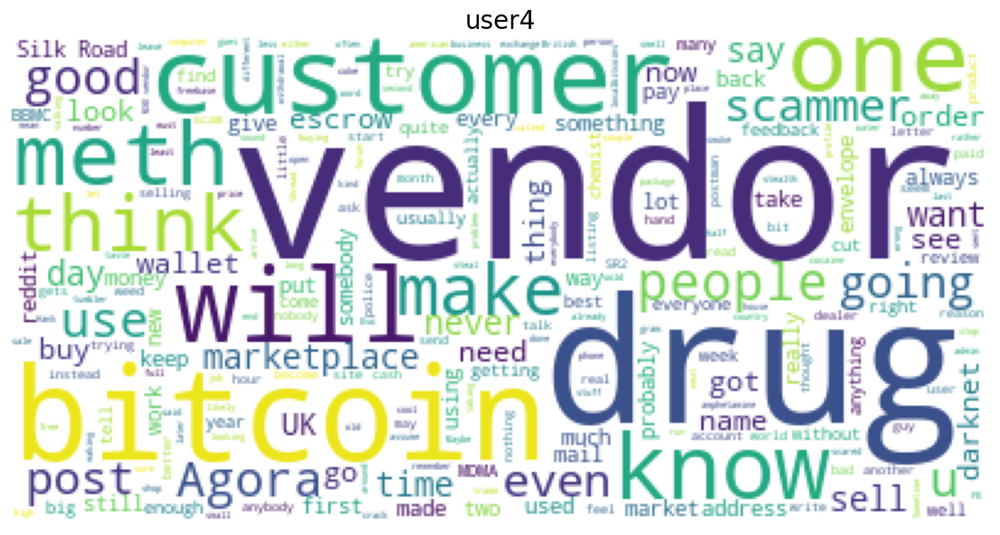

frequency words of user5 are : [('.', 2625), (',', 2163), ('the', 1643), ('to', 1366), ('I', 1275), ('a', 1162), ('of', 1099), ('and', 1070), ('you', 949), ('is', 892), ('that', 853), ('it', 750), ("''", 523), ('``', 497), ('in', 491), ('for', 477), ('are', 461), ("n't", 453), ("'s", 407), ('not', 401), ('have', 388), ('on', 385), ('be', 359), ('?', 351), ('this', 340), ('with', 335), ('do', 319), ('just', 315), ('they', 315), ('your', 307), ('*', 305), ('my', 292), ('...', 283), ('or', 251), ('as', 248), ('was', 243), ('would', 241), ('if', 227), ('like', 219), ('from', 218), ('people', 217), ('at', 209), ('but', 209), ('what', 200), ('get', 198), ('can', 195), ('all', 191), ('up', 181), ('than', 176), (';', 173), ('will', 172), ('so', 171), (')', 170), ('more', 167), ('about', 166), ('It', 165), ('one', 165), ('&', 159), ('no', 159), ('an', 157), ('(', 157), ('The', 156), ('me', 150), ('If', 148), ('out', 147), ('know', 144), ('has', 143), ('vendor', 141), ('gt', 141), ('time', 140),

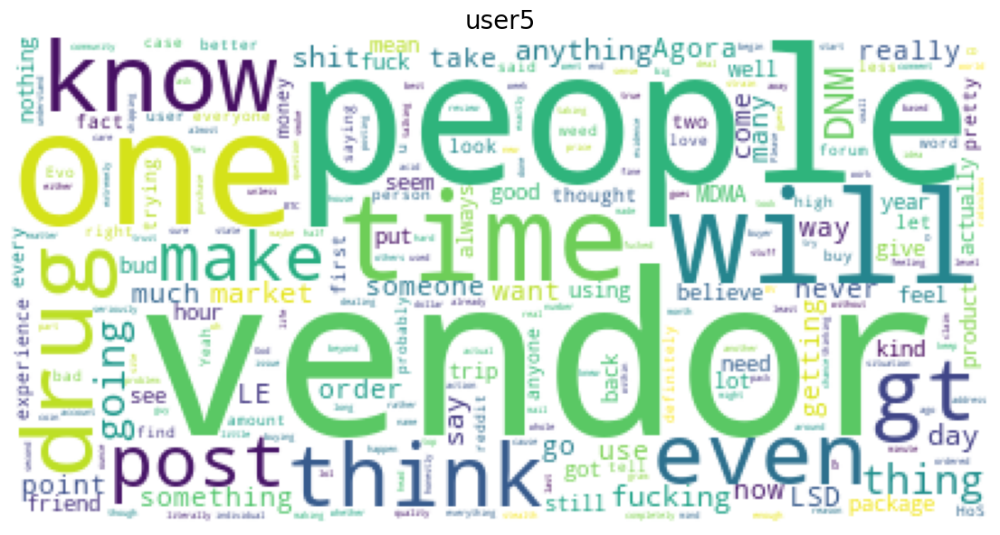

frequency words of user6 are : [('.', 2619), (',', 2078), ('I', 1644), ('the', 1461), ('to', 1219), ('and', 1182), ('a', 1091), ('*', 913), ('of', 813), ('that', 787), ('it', 750), ('you', 714), ('is', 536), ("n't", 531), ("'s", 521), ('in', 503), ('for', 419), ('but', 401), ('have', 382), ('be', 355), ('on', 349), ('was', 315), ('my', 308), ('do', 307), ('as', 300), ('are', 282), ('with', 276), ('just', 266), ('this', 265), ('?', 245), ('your', 238), ('or', 229), ('not', 222), ('he', 220), ('me', 212), ('all', 212), ('like', 211), ('we', 210), (';', 206), ('from', 189), ('if', 187), ("'m", 182), ("'ve", 176), ('so', 176), ('vendor', 170), ("''", 165), ("'re", 164), ('an', 163), ('some', 163), ('``', 160), ('about', 159), ('they', 159), ('up', 154), ('can', 152), (')', 146), ('at', 145), ('one', 142), ('would', 142), ('what', 140), ('had', 139), ("'ll", 139), ('more', 135), ('time', 135), ('has', 133), ('out', 132), ('his', 124), ('It', 123), ('any', 122), ('(', 122), ('no', 122), ('th

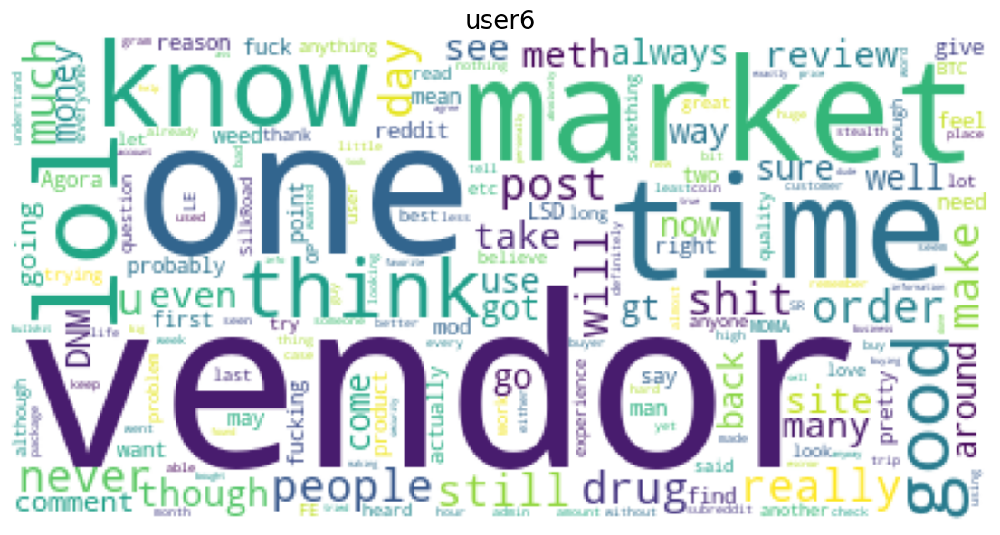

frequency words of user7 are : [('.', 2692), ('the', 1961), ('a', 1471), ('to', 1442), (',', 1326), ('and', 1321), ('of', 1013), ('you', 891), ('is', 776), ('that', 642), ("'s", 605), ('it', 568), ('in', 566), ('Grand', 546), ('Wizard', 546), ('on', 493), ('for', 463), ('*', 441), ('be', 439), ('with', 386), (':', 380), ('The', 379), ('are', 367), ('or', 344), ('your', 341), ("n't", 339), ("''", 337), ('``', 334), ('(', 313), (')', 311), ('as', 307), ('have', 300), ('at', 273), ('has', 255), ('they', 247), ('he', 240), ('do', 240), ('we', 239), ('I', 236), ('would', 236), ('this', 233), ('but', 223), ('who', 216), ('was', 213), ('from', 210), ('not', 209), ('get', 207), ('can', 205), ('will', 205), ('an', 204), ('if', 201), ('up', 193), ("'re", 189), (';', 186), ('than', 181), ('?', 179), ('more', 177), ('his', 174), ('If', 162), ('like', 162), ('some', 162), ('about', 162), ('--', 159), ('their', 158), ('And', 149), ('&', 146), ('out', 145), ('one', 144), ('there', 143), ('people', 14

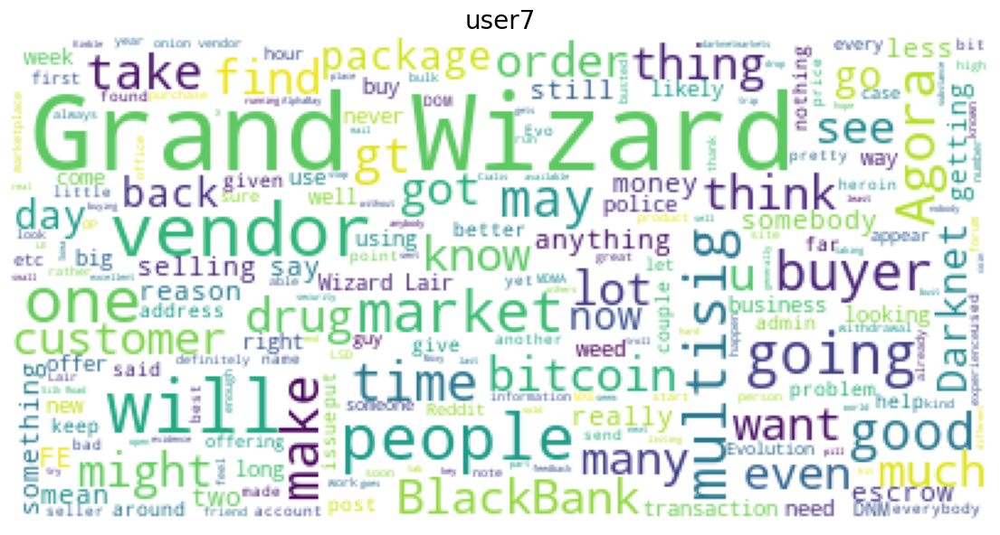

frequency words of user8 are : [('.', 2284), ('I', 1407), ('the', 1206), ('to', 990), ('a', 938), ('and', 881), (',', 873), ('it', 827), ('you', 813), ('of', 546), ('that', 508), ("n't", 505), ('is', 500), ('in', 406), ('have', 353), ('do', 347), ('was', 325), ('but', 324), ('are', 300), ('for', 285), ('would', 284), ('on', 282), ('be', 265), ('your', 244), ('like', 242), ('or', 238), ('if', 232), ('they', 226), ('?', 216), ('get', 211), ('this', 208), ('with', 206), ('not', 202), ('just', 196), ('will', 188), ("'s", 184), ('so', 181), ('can', 173), ('as', 171), ('(', 166), (')', 166), ('up', 163), ('he', 160), ('all', 149), ('post', 144), ('some', 141), ('people', 141), ('about', 137), ('them', 134), ('out', 130), ('my', 129), ('You', 128), ('If', 127), ('at', 126), ('from', 125), ('think', 124), ('vendor', 123), ('there', 120), ('had', 116), ('what', 114), ("'m", 113), ('me', 112), ('know', 110), ('one', 110), ('It', 109), ('good', 109), ('could', 107), (':', 106), ('more', 104), ("'

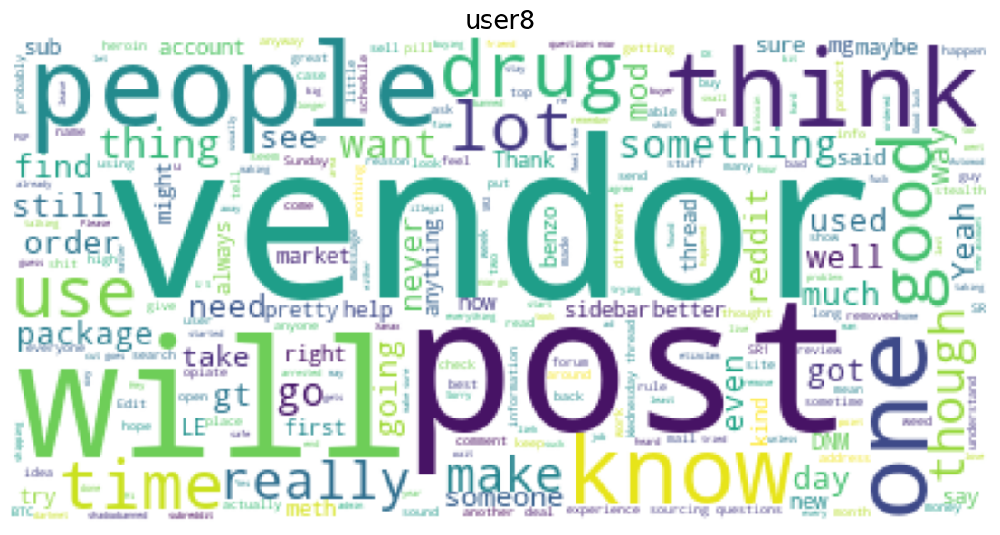

frequency words of user9 are : [('.', 2234), ('the', 1470), ('to', 1098), (',', 848), ('a', 842), ('I', 811), ('and', 660), ('is', 634), ('of', 478), (':', 448), ('that', 403), ('you', 402), (';', 387), ('it', 382), ("n't", 375), ('&', 334), ('they', 330), ('be', 326), ('in', 325), ('for', 311), ('are', 305), ('gt', 300), ('have', 288), ('*', 285), ('was', 275), ('not', 271), ('this', 259), ('(', 243), (')', 243), ('do', 223), ('on', 217), ('with', 198), ('would', 192), ('but', 186), ('if', 182), ('or', 181), ('your', 174), ('?', 165), ('can', 162), ('The', 158), ("'s", 153), ('so', 146), ('he', 138), ('like', 137), ('will', 134), ('we', 128), ('one', 124), ('an', 124), ('from', 122), ('use', 119), ('as', 119), ('think', 116), ('its', 116), ('their', 109), ('them', 107), ('This', 106), ('about', 105), ("'m", 105), ('people', 103), ('If', 100), ('just', 99), ('there', 96), ('only', 92), ('more', 90), ('does', 86), ('some', 86), ('could', 86), ('[', 86), (']', 86), ('then', 85), ('by', 8

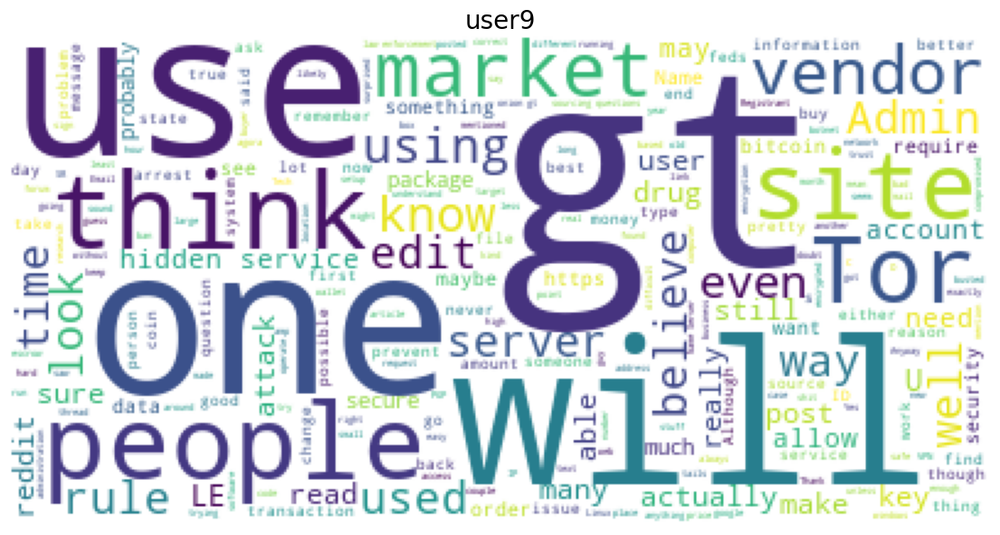

2275it [00:00, 190901.92it/s]

darkreddit_authorship_attribution_val_anon.jsonl


frequency words of user1 are : [('.', 3155), ('the', 1835), (',', 1795), ('I', 1494), ('a', 1403), ('to', 1344), ('and', 906), ('it', 902), ('you', 881), ('that', 845), ('is', 816), ('of', 764), ("n't", 741), ('in', 561), ('be', 454), ('are', 453), ('do', 420), ('for', 407), ('they', 404), ('have', 394), ('this', 381), ('if', 381), ('was', 374), ("'s", 365), ('on', 356), ('not', 352), ('or', 326), ('but', 324), ('with', 308), ('?', 286), ('as', 263), ('your', 262), ('would', 245), ('just', 228), ('vendor', 222), ('get', 207), ('he', 200), ('its', 198), ('like', 193), ('think', 190), ('at', 189), ('up', 182), ('what', 181), ('so', 175), ('from', 173), ('can', 172), ("'d", 171), ('did', 170), ('If', 169), ('there', 168), ('could', 163), ('all', 163), ('-', 162), ('my', 159), ('know', 159), ('out', 154), (')', 154), ('about', 151), ('an', 151), ('will', 151), ('(', 147), ('one', 136), ('But', 135), ('some', 133), ("''", 131), ('were', 130), ('``', 130), ('time', 127), ('who', 126), ('peop

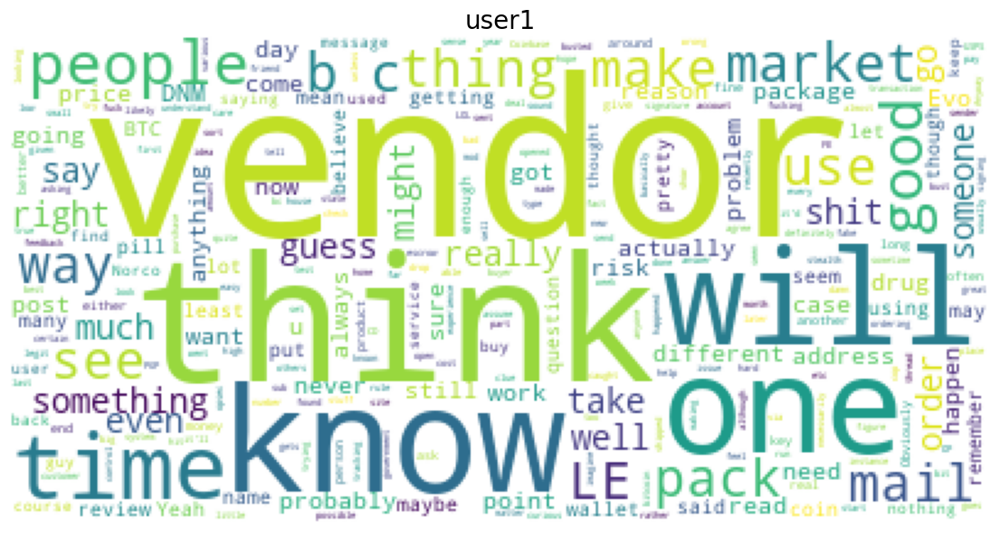

frequency words of user2 are : [('.', 2086), ('to', 1511), ('the', 1313), (',', 1064), ('a', 1029), ('I', 980), ('and', 870), ('is', 641), ('you', 639), ('it', 630), ('of', 621), ('that', 504), ('in', 488), ('for', 471), ("n't", 443), ('have', 402), ('are', 368), ('as', 357), ("'s", 288), ('be', 282), ('do', 278), ('this', 267), ('on', 267), ('people', 265), ('we', 246), ('not', 245), ('they', 242), ('your', 237), ('with', 234), ('or', 228), ('but', 221), ('*', 208), ('about', 188), ('if', 171), ('so', 164), ('what', 156), ('just', 155), ('will', 153), ('like', 149), ('can', 147), ('thread', 145), ('It', 143), ('``', 142), (')', 141), ('am', 140), ('one', 138), ('(', 137), ("''", 135), ('post', 134), ('was', 134), ('all', 130), ('them', 129), ('out', 129), ('We', 128), ('at', 126), ('here', 125), ("'re", 124), (';', 124), ('an', 121), ('my', 117), ('!', 117), ('would', 116), ('me', 114), ('get', 112), ('really', 110), ('more', 110), ('he', 110), ('there', 108), ('rules', 107), ('who', 

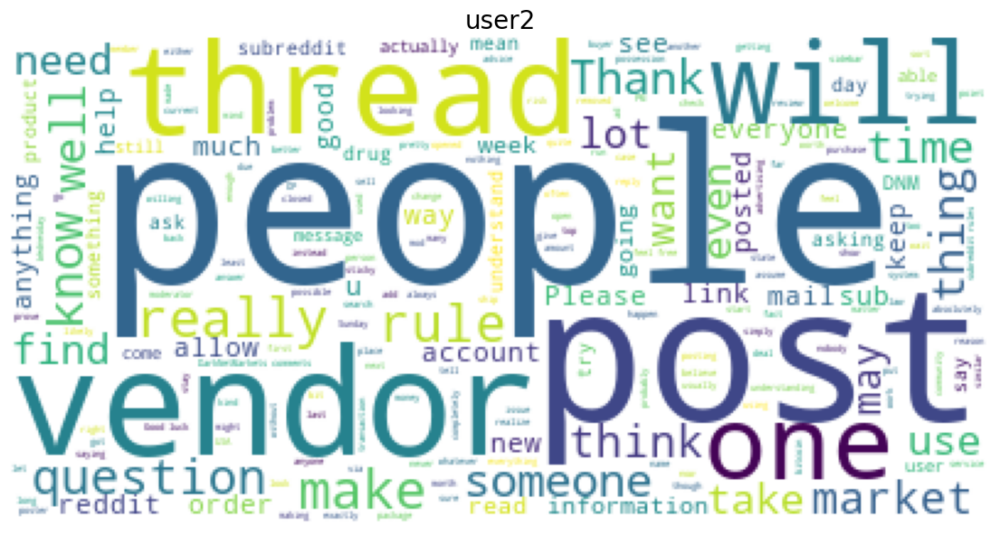

frequency words of user3 are : [('.', 1088), ('the', 750), ('to', 622), (',', 590), ('a', 507), ('and', 490), ('you', 487), ('it', 413), ('of', 342), ('that', 321), ('in', 272), ("'s", 255), ("n't", 229), ('for', 202), ('is', 190), ('your', 188), ('be', 177), ('they', 175), ('on', 165), ('i', 157), ('do', 152), ('if', 136), ('have', 133), ('with', 131), ('just', 128), ('I', 119), ('are', 118), (';', 113), ('&', 108), ('get', 105), ('*', 104), ('not', 103), ('gt', 103), ("'re", 102), ('or', 100), ('as', 98), ('can', 96), ('from', 94), ('would', 91), ('?', 86), ('at', 76), (')', 75), ('them', 74), ('all', 74), ('(', 74), ('out', 73), ('about', 72), ('one', 72), ('up', 71), ('what', 69), ('was', 69), ('so', 67), ('like', 62), ('he', 62), ('my', 60), ('their', 57), ('there', 56), ('but', 53), ('only', 52), ('this', 52), ('any', 51), ('an', 51), ('...', 51), ('because', 50), ("'ll", 49), ('by', 49), ("''", 49), ('some', 48), ('go', 48), ('does', 48), ('time', 48), ('more', 46), ('know', 45)

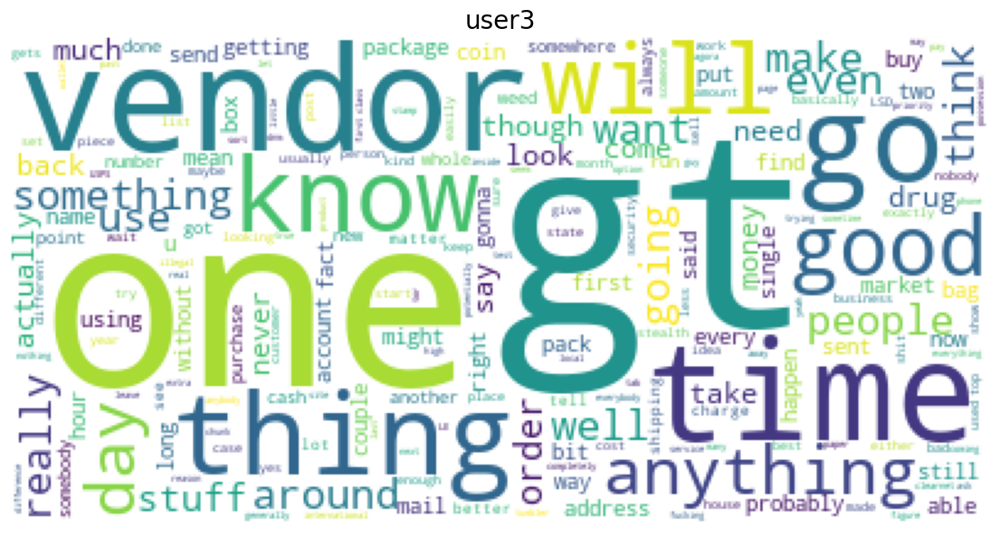

frequency words of user4 are : [('.', 2181), (',', 1768), ('the', 1326), ('to', 1050), ('a', 1026), ('and', 767), ('of', 662), ('you', 638), ('I', 600), ('it', 467), ("n't", 451), ('is', 419), ('in', 415), ('that', 357), ('on', 322), ('for', 313), ("''", 277), ('``', 270), ('are', 266), ('with', 244), ('do', 239), ('they', 238), ('have', 236), ('be', 235), ("'s", 228), ('your', 213), ('like', 195), ('vendor', 190), ('from', 180), ('who', 180), ('or', 176), ('?', 169), ('bitcoin', 167), ('he', 166), ('was', 165), ('but', 164), ('its', 160), ('an', 157), ("'re", 147), ('them', 140), ('The', 139), ('just', 136), ('You', 134), ('as', 131), ('can', 127), ('because', 125), ('about', 124), ('will', 121), ('vendors', 121), ('all', 120), ('get', 120), ('not', 120), ('one', 117), ('would', 117), ('if', 115), ('Its', 114), ('by', 112), ('their', 112), ('we', 111), ('If', 111), ('my', 108), ('at', 108), ('meth', 105), ('has', 103), ('out', 100), ('(', 98), ("'m", 97), ('so', 96), ("'ve", 96), (')'

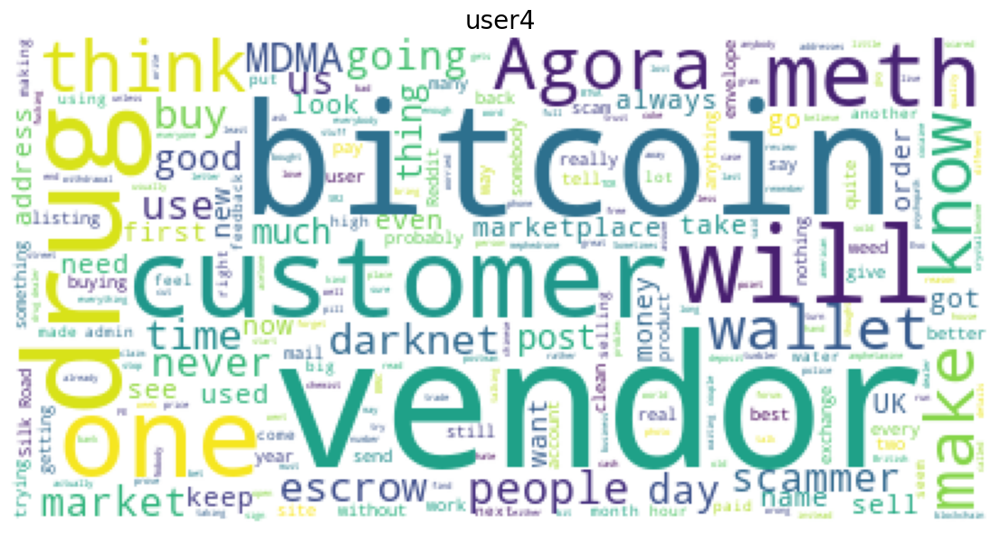

frequency words of user5 are : [('.', 881), (',', 676), ('the', 555), ('to', 495), ('you', 375), ('a', 374), ('I', 372), ('of', 340), ('that', 309), ('is', 299), ('and', 297), ('it', 227), ("''", 175), ('are', 172), ('``', 169), ('in', 164), ('not', 156), ('for', 154), ('be', 153), ("'s", 150), ("n't", 142), ('have', 134), ('on', 133), ('your', 133), ('?', 131), ('do', 114), ('this', 108), ('they', 98), ('people', 98), ('...', 95), ('with', 92), ('just', 88), ('*', 84), ('or', 81), ('would', 79), ('my', 76), ('about', 73), ('if', 73), ('can', 72), ('but', 72), ('like', 72), ('get', 71), ('from', 70), ('as', 69), ('was', 69), ('at', 69), ('know', 68), ('one', 66), ('what', 65), ('You', 64), ('even', 62), ('all', 62), ('It', 62), (')', 61), ('how', 61), ('than', 61), ('(', 58), ('more', 58), ('their', 55), ('me', 53), ('out', 53), (';', 53), ('an', 51), ('&', 50), ('gt', 49), ('no', 47), ('some', 45), ('then', 44), ('DNM', 44), ('there', 43), ('If', 43), ('will', 41), ('any', 41), (':', 

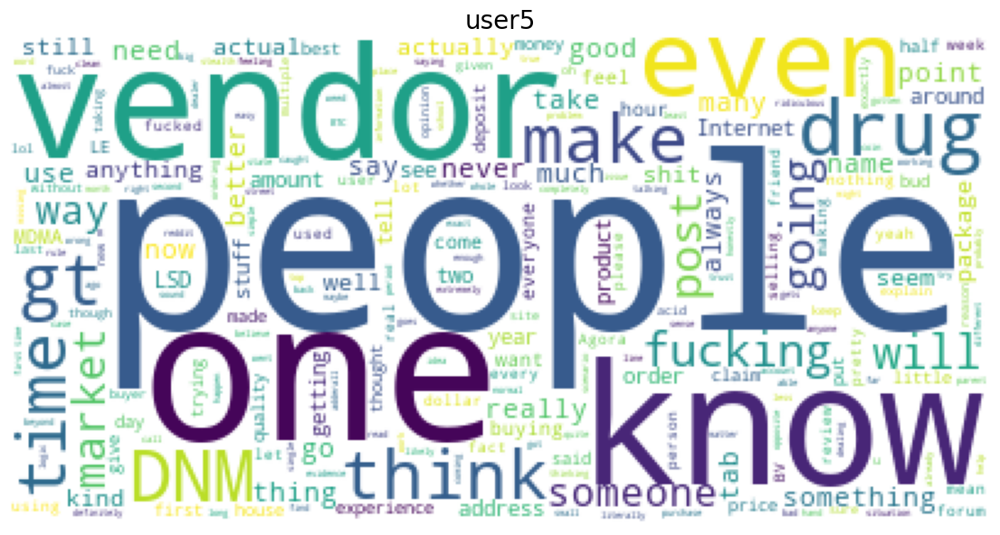

frequency words of user6 are : [('.', 879), (',', 730), ('I', 545), ('the', 504), ('to', 450), ('and', 418), ('a', 366), ('*', 302), ('of', 290), ('that', 270), ('you', 265), ('it', 239), ("n't", 208), ('is', 172), ('in', 170), ('for', 151), ("'s", 144), ('but', 121), ('was', 113), ('be', 109), ('do', 109), ('have', 109), ('my', 103), ('as', 99), ('on', 99), ('not', 97), ('just', 90), ('with', 86), ('this', 83), ('we', 80), ('?', 80), ('he', 79), ('or', 78), ('are', 71), ('your', 71), ("'m", 70), ('from', 70), ('me', 66), ("'ve", 65), ('they', 63), ('so', 62), ('at', 60), ('vendor', 60), ('if', 57), ('would', 55), (';', 55), ('all', 54), ('had', 54), ('can', 54), ("'re", 54), ('has', 53), ('out', 53), ('like', 53), ('time', 53), ('an', 52), ('about', 52), ('more', 50), ('one', 48), ('what', 47), ('vendors', 46), ('his', 46), ('know', 45), ('some', 43), ('up', 43), ('lol', 43), ('when', 43), ('who', 43), ('It', 42), ('think', 41), ('here', 39), ('no', 39), ('because', 38), ('get', 38), 

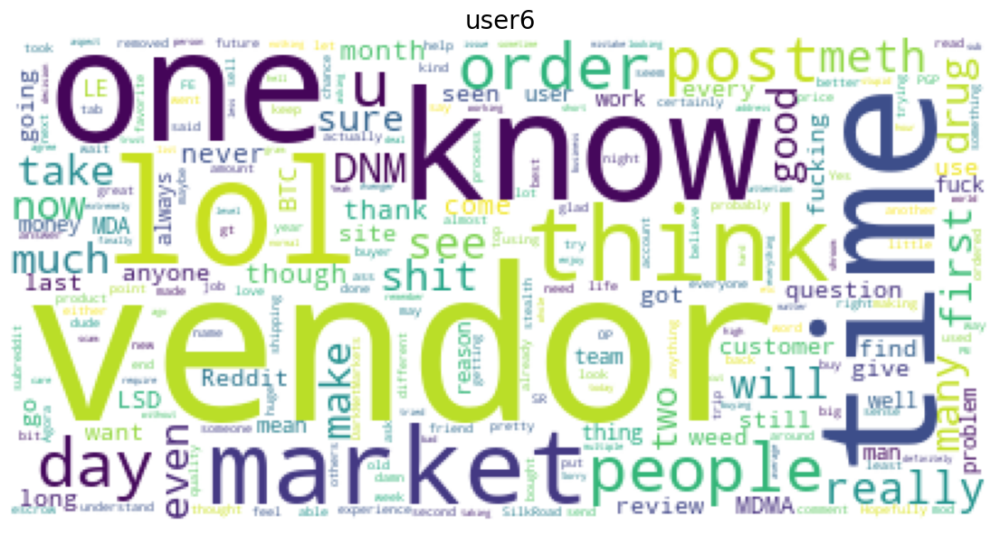

frequency words of user7 are : [('.', 885), ('the', 597), ('and', 465), (',', 456), ('a', 456), ('to', 444), ('of', 331), ('is', 271), ('you', 266), ('it', 206), ('that', 191), ("'s", 183), ('Grand', 179), ('in', 179), ('Wizard', 177), ('on', 165), ('for', 164), ('be', 148), ('are', 137), ("''", 136), ('``', 134), (':', 132), ('with', 126), ('The', 122), ('*', 122), (')', 122), ("n't", 121), ('(', 118), ('your', 110), ('or', 107), ('they', 102), ('can', 100), ('have', 95), ('has', 90), ('not', 89), ('this', 87), ('an', 86), ('as', 83), ('we', 82), ('do', 82), ('would', 79), ('he', 78), ('but', 74), ('who', 73), ('at', 69), ('I', 67), ('from', 67), ('was', 67), ('get', 67), ('if', 66), ('more', 64), ('about', 63), ('?', 62), ('will', 61), ('up', 60), ('than', 58), ('one', 58), ('And', 56), ('like', 55), ('his', 54), ("'re", 54), ('out', 53), ('their', 53), ('by', 52), ('all', 52), ('how', 49), ('some', 49), (';', 49), ('vendor', 48), ('may', 48), ('our', 47), ('there', 47), ('so', 45), 

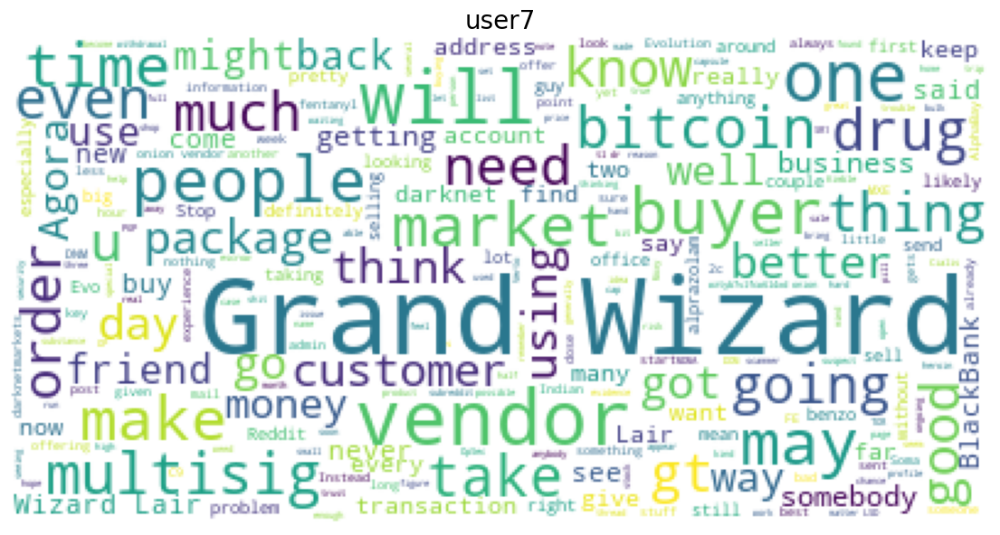

frequency words of user8 are : [('.', 788), ('I', 538), ('the', 359), ('to', 311), ('a', 302), ('and', 301), ('it', 292), (',', 285), ('you', 271), ('is', 188), ('of', 171), ("n't", 166), ('that', 163), ('in', 143), ('have', 136), ('but', 133), ('do', 124), ('for', 117), ('are', 110), ('would', 109), ('on', 100), ('be', 88), ('your', 83), ('was', 80), ('they', 80), ('like', 79), ('this', 78), ('so', 77), ('if', 77), ('or', 77), ('just', 74), ('not', 74), ("'s", 68), ('?', 67), ('get', 64), ('as', 62), ('will', 62), ('(', 60), (')', 58), ('some', 57), ('he', 55), ('about', 53), ('can', 52), ('though', 51), ('my', 50), ("'m", 50), ('me', 48), ('good', 47), ('out', 47), ('with', 46), ('up', 45), ('vendor', 44), ('them', 44), ('from', 44), ('people', 44), ('If', 43), ('all', 43), ('what', 43), ('think', 42), ('there', 42), ('one', 41), ('could', 40), ('did', 39), ("''", 38), ('really', 38), ('know', 37), ('because', 37), ('at', 37), ('``', 36), (':', 35), ('You', 35), ('were', 34), ('It', 

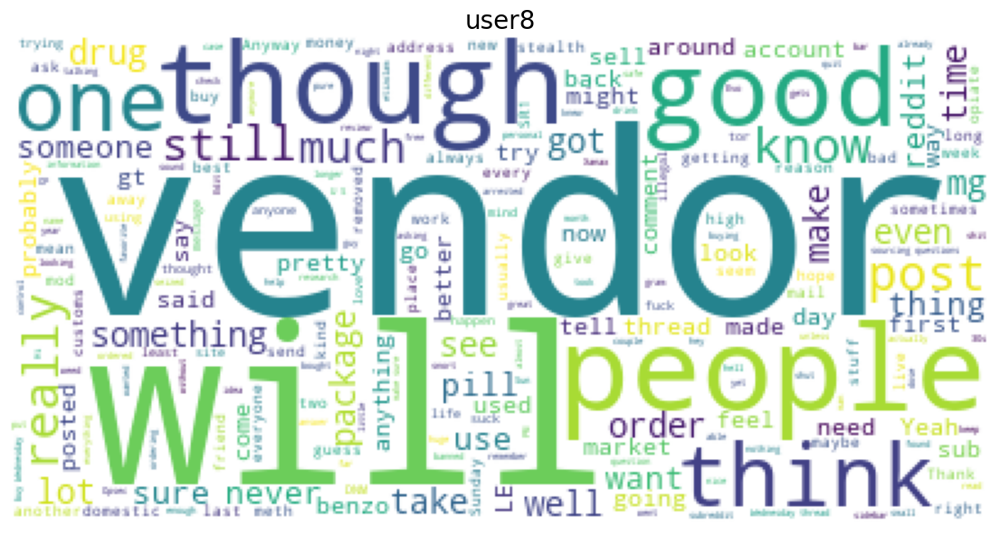

frequency words of user9 are : [('.', 850), ('the', 608), ('to', 418), (',', 351), ('a', 334), ('I', 300), ('and', 242), ('of', 212), ('is', 200), ('you', 170), (';', 153), ('in', 145), ('that', 143), ("n't", 132), ('&', 128), ('*', 128), (')', 127), ('it', 127), ('(', 124), ('gt', 119), ('was', 119), ('not', 115), ('they', 114), ('are', 111), ('be', 107), ('this', 104), ('for', 101), ('or', 99), ('do', 93), ('have', 86), ('can', 85), (':', 83), ('but', 72), ('if', 70), ('on', 70), ('with', 69), ("'s", 68), ('an', 66), ('would', 66), ('its', 59), ('your', 58), ('?', 56), ('use', 55), ('from', 53), ('he', 53), ('The', 53), ('This', 51), ('think', 49), ('so', 48), ('like', 46), ('If', 43), ('more', 43), ('about', 42), ('only', 42), ('very', 42), ("'m", 42), ('will', 41), ('as', 38), ('one', 37), ('there', 37), ('just', 36), ('could', 35), ('their', 35), ('them', 33), ('[', 32), (']', 32), ('other', 32), ('by', 32), ('out', 31), ('then', 31), ('people', 30), ('all', 29), ('also', 27), ('a

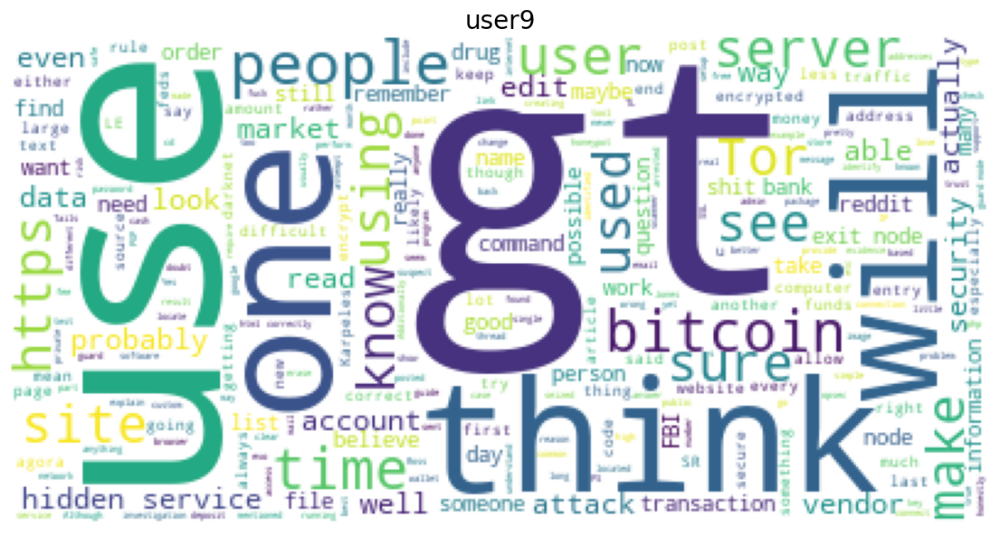

In [19]:
for j in range (0,3):
    author_text = open_file(files[j])
    print(files[j])
    for i in range (1,10):
        author_name = "user" + str(i)
        frequency_word(author_name,author_text)
        #print(author_dict[author_name])

In [12]:

#fd = FreqDist(word_tokens)
#fd.most_common(100)

In [11]:


# wc = WordCloud(background_color='white', #设置颜色
#                    max_words=1500,
#                    stopwords = STOPWORDS
#             )
#
# wc.generate(sents)
#
# fig = plt.figure()
# fig.set_figwidth(14)
# fig.set_figheight(18)
#
# plt.imshow(wc
#           )
# plt.title("", fontsize=20)
# plt.axis('off')
# plt.show()

In [20]:
# from emot.emo_unicode import UNICODE_EMOJI
# def process_tweets(text):
#     text = str(text).lower()
#     text = re.sub('\[.*?\]', '', text)
#     text = re.sub('https?://\S+|www\.\S+', '', text)
#     text = re.sub('<.*?>+', '', text)
#     text = re.sub('(@[A-Za-z0-9_]+)','',text)
#     text = re.sub('[%s]' % re.escape(string.punctuation), '', text)
#     text = re.sub('\n', '', text)
#     text = re.sub('\w*\d\w*', '', text)
#     text = text.split()
#     text = [word for word in text if word not in emojis]
#     text = ' '.join(text)
#     return text
#
# emojis = list(UNICODE_EMOJI.keys())
# data['Selected_text'] = data['tweet'].apply(process_tweets)

TypeError: list indices must be integers or slices, not str